In [1]:

!pip install google-cloud-aiplatform ragstack-ai --upgrade

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.4/3.4 MB 9.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 40.3/40.3 kB 2.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 803.6/803.6 kB 12.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 27.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 230.3/230.3 kB 8.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 15.8/15.8 MB 22.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 17.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.0/54.0 kB 2.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 225.1/225.1 kB 6.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.0/2.0 MB 45.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 147.9/147.9 kB 10.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 75.9/75.9 kB 4.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━

In [2]:
# Imports
import pandas as pd
import numpy as np
import getpass, os, requests, sys, json, vertexai
import json
from google.colab import userdata, auth, files, drive
from google.cloud import aiplatform
from astrapy.db import AstraDB, AstraDBCollection
from vertexai.preview.vision_models import MultiModalEmbeddingModel, Image
from datetime import datetime

In [3]:
# Reading the dataset related to oil well IOT data
file_path = '/content/sample_data/iot_data_without_embeddings.csv'

# Read the CSV file
df = pd.read_csv(file_path)


In [4]:
credential_names = ["GCP_PROJECT_ID", "ASTRA_DB_ENDPOINT", "ASTRA_DB_TOKEN"]

# Get credentials
for credential in credential_names:
  if credential not in os.environ:
     os.environ[credential] = getpass.getpass("Provide your " + credential)

Provide your GCP_PROJECT_ID··········
Provide your ASTRA_DB_ENDPOINT··········
Provide your ASTRA_DB_TOKEN··········


In [5]:
!gcloud config set project {os.environ["GCP_PROJECT_ID"]}

auth.authenticate_user()

Updated property [core/project].


In [6]:
# Connect to Astra DB vector database
astra_db = AstraDB(
    token=os.getenv("ASTRA_DB_TOKEN"),
    api_endpoint=os.getenv("ASTRA_DB_ENDPOINT"))

# If initializing a brand new collection -- uncomment
#collection = astra_db.create_collection(
 #   collection_name="iot_bot",
 #   dimension=10)

# If using an existing collection
collection = AstraDBCollection(
    collection_name="iot_bot", astra_db=astra_db
)

In [7]:
# Initialize Vertex AI
vertexai.init(project=os.getenv("GCP_PROJECT_ID"))

# Using Vertex AI multi-modal embedding generator
model = MultiModalEmbeddingModel.from_pretrained("multimodalembedding@001")

# Takes an image (URL or image file) and returns it
def get_image(image_source):
  if image_source.startswith('http://') or image_source.startswith('https://'):
    img_bytes = requests.get(image_source).content
    img = Image(img_bytes)
    return img
  else:
    img = Image.load_from_file(image_source)
    return img



In [8]:
# Dataset used and read as a DataFrame
df_csv = pd.read_csv("/content/sample_data/iot_data_without_embeddings.csv")
df_csv.head(7)

,Device_ID,Timestamp,Temperature,Pressure,Image_URL,Image_Score,Image_Embeddings
0,device_87,2024-01-16 15:00:43,70.30,9.39,https://img-aws.ehowcdn.com/877x500p/s3-us-wes...,4,"[-0.04371459, -0.05684032, -0.05581067, -0.030..."
1,device_29,2024-01-15 12:32:23,68.93,6.06,https://img-aws.ehowcdn.com/877x500p/s3-us-wes...,3,"[-0.04371459, -0.05684032, -0.05581067, -0.030..."
2,device_53,2024-01-14 10:04:04,88.70,5.54,https://scx1.b-cdn.net/csz/news/800a/2022/oil-...,8,"[0.3432, 0.4323, 0.5434, 0.2342, 0.3453, 0.756..."
3,device_96,2024-01-13 7:35:45,62.61,4.61,https://d27p2a3djqwgnt.cloudfront.net/wp-conte...,5,"[0.345, 0.456, 0.234, 0.567, 0.89, 0.123, 0.45..."
4,device_10,2024-01-12 5:07:26,93.50,2.86,https://news.mit.edu/sites/default/files/style...,1,"[-0.00411055, 0.00221584, -0.00034929, -0.0011..."
5,device_92,2024-01-11 2:39:07,53.66,4.81,https://news.mit.edu/sites/default/files/style...,3,"[-0.00411055, 0.00221584, -0.00034929, -0.0011..."
6,device_1,2024-01-10 0:10:47,56.53,8.77,https://d27p2a3djqwgnt.cloudfront.net/wp-conte...,5,"[0.345, 0.456, 0.234, 0.567, 0.89, 0.123, 0.45..."


In [9]:
# Unique image list from dataset
img_list = df_csv.Image_URL.unique()

# Initialize an empty list to store data
data_map = []
img_rendered = []

for img in img_list:
    try:
        vector = get_image(img)
        data_map.append({
            "orig_image": img,  # or some reference like a URL or file path
            "vector": vector
        })
        img_rendered.append(vector)

    except Exception as e:
        print(f"Error processing image: {e}")

# Create a DataFrame from the collected data
df_data = pd.DataFrame(data_map)

# Display the DataFrame
df_data

,orig_image,vector
0,https://img-aws.ehowcdn.com/877x500p/s3-us-wes...,<vertexai.vision_models.Image object at 0x7d99...
1,https://scx1.b-cdn.net/csz/news/800a/2022/oil-...,<vertexai.vision_models.Image object at 0x7d98...
2,https://d27p2a3djqwgnt.cloudfront.net/wp-conte...,<vertexai.vision_models.Image object at 0x7d99...
3,https://news.mit.edu/sites/default/files/style...,<vertexai.vision_models.Image object at 0x7d99...
4,https://images.cnbctv18.com/wp-content/uploads...,<vertexai.vision_models.Image object at 0x7d99...


In [10]:
# Gets image embeddings using Google Gemini model
def get_img_embeddings(img, text=""):
  embeddings = model.get_embeddings(
      image=img,
      contextual_text=text
  )
  return embeddings.image_embedding



In [11]:
# Initialize an empty list to store data
data = []

for img in img_rendered:
    try:
        embeddings = get_img_embeddings(img)
        data.append({
            "image": img,  # or some reference like a URL or file path
            "embeddings": embeddings
        })
    except Exception as e:
        print(f"Error processing image: {e}")

# Create a DataFrame from the collected data
df = pd.DataFrame(data)

# Display the embeddings DataFrame
print(df)



                                               image  \
0  <vertexai.vision_models.Image object at 0x7d99...   
1  <vertexai.vision_models.Image object at 0x7d98...   
2  <vertexai.vision_models.Image object at 0x7d99...   
3  <vertexai.vision_models.Image object at 0x7d99...   
4  <vertexai.vision_models.Image object at 0x7d99...   

                                          embeddings  
0  [-0.0132105993, 0.0344397463, -0.0120734517, 0...  
1  [0.00447233, 0.0208603255, -0.0139496112, -0.0...  
2  [-0.00688419212, -0.0136375474, -0.0469587632,...  
3  [-0.0101069389, 0.0316411145, -0.00457819365, ...  
4  [0.0130381472, 0.012538407, -0.0203544684, -0....  


In [12]:
# merge dataframe to add new embeddings
df.rename(columns={'image':'vector'}, inplace=True)
df_combined = pd.merge(df_data, df, on='vector', how='outer')
df_combined.rename(columns={'orig_image':'Image_URL'}, inplace=True)
df_combined.head()

,Image_URL,vector,embeddings
0,https://img-aws.ehowcdn.com/877x500p/s3-us-wes...,<vertexai.vision_models.Image object at 0x7d99...,"[-0.0132105993, 0.0344397463, -0.0120734517, 0..."
1,https://scx1.b-cdn.net/csz/news/800a/2022/oil-...,<vertexai.vision_models.Image object at 0x7d98...,"[0.00447233, 0.0208603255, -0.0139496112, -0.0..."
2,https://d27p2a3djqwgnt.cloudfront.net/wp-conte...,<vertexai.vision_models.Image object at 0x7d99...,"[-0.00688419212, -0.0136375474, -0.0469587632,..."
3,https://news.mit.edu/sites/default/files/style...,<vertexai.vision_models.Image object at 0x7d99...,"[-0.0101069389, 0.0316411145, -0.00457819365, ..."
4,https://images.cnbctv18.com/wp-content/uploads...,<vertexai.vision_models.Image object at 0x7d99...,"[0.0130381472, 0.012538407, -0.0203544684, -0...."


In [13]:
# append new embeddings to orginal dataframe
df_mapped = pd.merge(df_csv, df_combined, on='Image_URL', how='outer')
df_mapped.head()

,Device_ID,Timestamp,Temperature,Pressure,Image_URL,Image_Score,Image_Embeddings,vector,embeddings
0,device_87,2024-01-16 15:00:43,70.30,9.39,https://img-aws.ehowcdn.com/877x500p/s3-us-wes...,4,"[-0.04371459, -0.05684032, -0.05581067, -0.030...",<vertexai.vision_models.Image object at 0x7d99...,"[-0.0132105993, 0.0344397463, -0.0120734517, 0..."
1,device_29,2024-01-15 12:32:23,68.93,6.06,https://img-aws.ehowcdn.com/877x500p/s3-us-wes...,3,"[-0.04371459, -0.05684032, -0.05581067, -0.030...",<vertexai.vision_models.Image object at 0x7d99...,"[-0.0132105993, 0.0344397463, -0.0120734517, 0..."
2,device_76,2024-01-05 14:17:31,74.30,9.25,https://img-aws.ehowcdn.com/877x500p/s3-us-wes...,2,"[-0.04371459, -0.05684032, -0.05581067, -0.030...",<vertexai.vision_models.Image object at 0x7d99...,"[-0.0132105993, 0.0344397463, -0.0120734517, 0..."
3,device_17,2024-01-04 11:49:11,72.71,3.69,https://img-aws.ehowcdn.com/877x500p/s3-us-wes...,1,"[-0.04371459, -0.05684032, -0.05581067, -0.030...",<vertexai.vision_models.Image object at 0x7d99...,"[-0.0132105993, 0.0344397463, -0.0120734517, 0..."
4,device_17,2024-01-02 6:52:33,59.28,9.55,https://img-aws.ehowcdn.com/877x500p/s3-us-wes...,4,"[-0.04371459, -0.05684032, -0.05581067, -0.030...",<vertexai.vision_models.Image object at 0x7d99...,"[-0.0132105993, 0.0344397463, -0.0120734517, 0..."


In [14]:
# remove columns not required
df_mapped = df_mapped.drop('Image_Embeddings', axis=1)
df_mapped.head()

,Device_ID,Timestamp,Temperature,Pressure,Image_URL,Image_Score,vector,embeddings
0,device_87,2024-01-16 15:00:43,70.30,9.39,https://img-aws.ehowcdn.com/877x500p/s3-us-wes...,4,<vertexai.vision_models.Image object at 0x7d99...,"[-0.0132105993, 0.0344397463, -0.0120734517, 0..."
1,device_29,2024-01-15 12:32:23,68.93,6.06,https://img-aws.ehowcdn.com/877x500p/s3-us-wes...,3,<vertexai.vision_models.Image object at 0x7d99...,"[-0.0132105993, 0.0344397463, -0.0120734517, 0..."
2,device_76,2024-01-05 14:17:31,74.30,9.25,https://img-aws.ehowcdn.com/877x500p/s3-us-wes...,2,<vertexai.vision_models.Image object at 0x7d99...,"[-0.0132105993, 0.0344397463, -0.0120734517, 0..."
3,device_17,2024-01-04 11:49:11,72.71,3.69,https://img-aws.ehowcdn.com/877x500p/s3-us-wes...,1,<vertexai.vision_models.Image object at 0x7d99...,"[-0.0132105993, 0.0344397463, -0.0120734517, 0..."
4,device_17,2024-01-02 6:52:33,59.28,9.55,https://img-aws.ehowcdn.com/877x500p/s3-us-wes...,4,<vertexai.vision_models.Image object at 0x7d99...,"[-0.0132105993, 0.0344397463, -0.0120734517, 0..."


In [15]:
# verify counts
df_mapped.count()

Device_ID      2000
Timestamp      2000
Temperature    2000
Pressure       2000
Image_URL      2000
Image_Score    2000
vector         2000
embeddings     2000
dtype: int64

In [16]:
# Define conditions and corresponding categories
conditions = [
    df_mapped['Temperature'] <= 50,
    ((df_mapped['Temperature'] >= 50) & (df_mapped['Temperature'] < 85)),
    df_mapped['Temperature'] > 85
]

# Define the category for each condition based on temperature
categories = ['Low', 'Medium', 'High']

# Create a new column with categories
df_mapped['Category'] = np.select(conditions, categories, default='Normal')

print(df_mapped)

      Device_ID            Timestamp  Temperature  Pressure  \
0     device_87  2024-01-16 15:00:43        70.30      9.39   
1     device_29  2024-01-15 12:32:23        68.93      6.06   
2     device_76  2024-01-05 14:17:31        74.30      9.25   
3     device_17  2024-01-04 11:49:11        72.71      3.69   
4     device_17   2024-01-02 6:52:33        59.28      9.55   
...         ...                  ...          ...       ...   
1995  device_16  2018-01-12 15:43:55        93.07      7.64   
1996  device_54  2018-01-11 13:15:35        70.80      8.82   
1997  device_83   2018-01-09 8:18:57        78.66      2.78   
1998   device_8  2018-01-04 22:25:40        62.16      1.75   
1999   device_9  2018-01-03 19:57:21        50.93      7.25   

                                              Image_URL  Image_Score  \
0     https://img-aws.ehowcdn.com/877x500p/s3-us-wes...            4   
1     https://img-aws.ehowcdn.com/877x500p/s3-us-wes...            3   
2     https://img-aws.ehowc

In [17]:
# export data to load into Astra vector db
df_mapped.to_csv("/content/sample_data/upload_file.csv", index=False)

Upload csv file from colab to Astra DB

In [18]:
# Displays recommendations returned by Astra Vector Search
def show_recommendations(documents, category=None):

  if category:
    print()
    print("Category:", category)
  for doc in documents:
    print("Temperature: ",doc["Temperature"])
    print("Pressure: ", doc["Pressure"])
    print("Image_URL: ", doc["Image_URL"])
    print("Similarity score: ", doc["$similarity"])
    if doc["$similarity"] < 0.78:
      print("This oil well likely requires maintenance/needs attention")
    else:
      print("This oil well is in a healthy state")

In [19]:
def determine_spike(documents):


  for spike in documents:

    if spike["Temperature"] < 55 or spike["Temperature"] > 80:


      print("Here are the instances when we saw an abnormal spike in the oil well: ", spike["Timestamp"])
    else:
      print("I cannot find any abnormal spikes in the oil well")

In [20]:
# Finds the similar items of the given reference image and categories (if any) along with a search prompt to give the model context
def find_similar_items(reference_image, categories=None):
  reference_img = get_image(reference_image)
  print("Reference image:")
  reference_img.show()

  search_prompt = """
      I am trying to find images of oil wells that are similar to what is in this
      picture.
    """
  reference_embeddings = get_img_embeddings(reference_img, text=search_prompt)

  # Run single ANN search across entire DB
  documents = collection.vector_find(
  reference_embeddings,
  limit=1
  )
  show_recommendations(documents)
  determine_spike(documents)

Reference image:


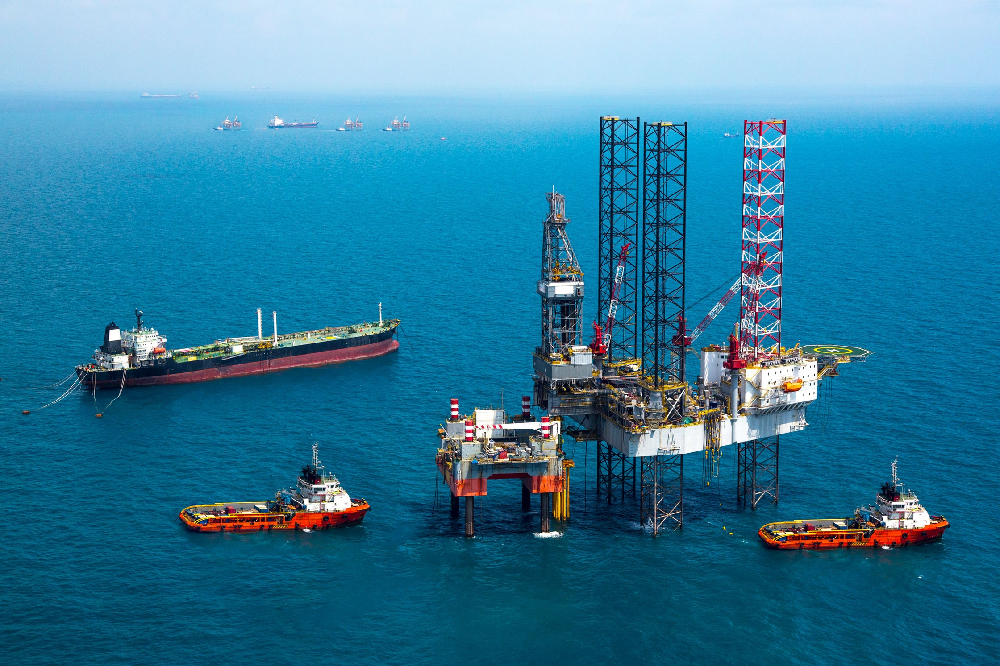

Temperature:  78.75
Pressure:  7.17
Image_URL:  https://news.mit.edu/sites/default/files/styles/news_article__image_gallery/public/images/201911/MIT-Oil-Well-Cement_0.jpg
Similarity score:  0.8827596
This oil well is in a healthy state
I cannot find any abnormal spikes in the oil well


In [25]:
# Reference image is a new image that we upload to verify if there is an anomoly in the oil well
reference_image = "https://media.wired.com/photos/5eab43c24d8ebca1ff20fe28/master/w_2240,c_limit/Science_oilwell_1004818498.jpg"
find_similar_items(reference_image, categories=categories)


Reference image:


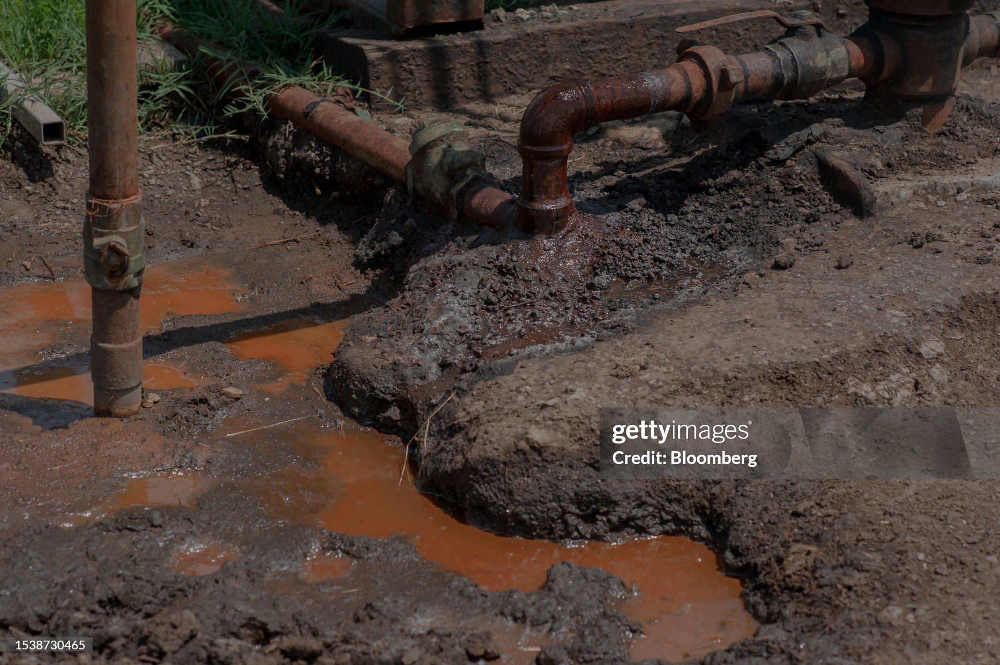

Temperature:  89.12
Pressure:  6.74
Image_URL:  https://scx1.b-cdn.net/csz/news/800a/2022/oil-leaks-from-equipme.jpg
Similarity score:  0.7733364
This oil well likely requires maintenance/needs attention
Here are the instances when we saw an abnormal spike in the oil well:  1705335083


In [24]:
# Reference image is a new image that we upload to verify if there is an anomoly in the oil well
reference_image = "https://media.gettyimages.com/id/1538730465/photo/plugging-methane-leaks-from-derelict-oil-wells-for-carbon-credit.jpg?s=2048x2048&w=gi&k=20&c=312TMhCOS3q4P0OMpDfgOZeggPqLqV4orOxzKoy2FSs="
find_similar_items(reference_image, categories=categories)
